In [1]:
import os

os.environ.setdefault("XLA_FLAGS", "--xla_force_host_platform_device_count=12")
import jax

jax.config.update("jax_enable_x64", True)
jax.config.update("jax_platform_name", "cpu")
print("JAX devices:", jax.devices())

JAX devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7), CpuDevice(id=8), CpuDevice(id=9), CpuDevice(id=10), CpuDevice(id=11)]


In [2]:
import sys
from pathlib import Path

repo_root = Path.cwd().resolve()
for parent in [repo_root, *repo_root.parents]:
    src = parent / "src"
    if (src / "gwemfish").is_dir():
        sys.path.insert(0, str(src))
        break

import matplotlib.pyplot as plt

from gwemfish.simple_pipeline import (
    _deep_merge_dict,
    make_default_cfg,
    plot_system_observation,
    setup_em_observation,
    setup_gw_observation,
    run_inference, 
    plot_posterior, 
    to_source_plane_samples, 
    plot_source_posterior,
)

#OUTPUT_DIR = os.path.join("examples", "outputs", "simple_pipeline_demonstration")
#os.makedirs(OUTPUT_DIR, exist_ok=True)
#print("OUTPUT_DIR:", os.path.abspath(OUTPUT_DIR))

In [15]:
from gwemfish.config import DEFAULT_KWARGS_NUMERICS, SOLVER_PARAMS
OUTPUT_DIR = "figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [4]:
import numpy as np

In [5]:
import matplotlib.pyplot as plt

### 1. galaxy that lenses GW signal in the background (large size)

In [6]:
source_pos = (0.05, 0.1)
cfg_1 = {
    "em": {
        "pixel_grid_kwargs": {"npix": int(40), "pix_scl": 0.1},
        "psf_kwargs": {"psf_type": "GAUSSIAN", "fwhm": 0.4, "pixel_size": 0.1},#0.067
        "noise_simu_kwargs": {"npix": int(40), "background_rms": 5e-2, "exposure_time": 2200},
        "noise_inf_kwargs": {"npix": int(40), "background_rms": None, "exposure_time": 2200},
        "kwargs_numerics": DEFAULT_KWARGS_NUMERICS,
        "exposure_time": 2200,
        "seed": 87651,
        "source_pos": source_pos,
        "kwargs_source": [
            {
                "amp": 250,
                "R_sersic": 0.4,
                "n_sersic": 4.0,
                "e1": -0.1,
                "e2": 0.2,
                "center_x": source_pos[0],
                "center_y": source_pos[1],
            }
        ],
        "kwargs_lens_light": [
            {
                "amp": 50.0,
                "R_sersic": 2.0,
                "n_sersic": 4.0,
                "e1": 0.0,
                "e2": 0.1,
                "center_x": 0.0,
                "center_y": 0.0,
            }
        ],
    },
    "lens": {
        "lens_model_list": ["EPL", "SHEAR"],
        "kwargs_lens": [
            {
                "theta_E": 1.2, #TBD but medium size
                "e1": 0.0,
                "e2": 0.1,
                "gamma": 2.0,
                "center_x": 0.0,
                "center_y": 0.0,
            },
            {"gamma1": 0.1, "gamma2": 0.0, "ra_0": 0.0, "dec_0": 0.0},
        ],
        "zl": 0.7,
        "zs": 1.5,
    },
    "gw": {
        "source_pos": source_pos,
        "solver_params": SOLVER_PARAMS,
        "image_box_half_width": 10.6,
        "error_scales": {
            "sigma_td": 0.05,
            "sigma_dL_eff": 3.0,
            "epsilon": 0.005,
        },
    },
    "plot": {"plot_mode": "groupwise", "save_path": None, "save_tag": None, "hist_kwargs": {"density": True}},
    "source_plane": {"filter_std": None, "use_filtered": False},
    "output": {
        "output_dir": OUTPUT_DIR,
        "save_samples_path": None,
        "save_truths_path": None,
        "save_source_samples_path": None,
        "save_system_plot_path": None,
        "json_path": None,
    },
}

In [7]:
cfg_1["use_parameter_layout"] = True

In [9]:
ctx_1:dict = setup_em_observation(cfg=cfg_1)


In [10]:
ctx_1.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst'])

In [11]:
ctx_1:dict = setup_gw_observation(ctx_1, cfg=cfg_1)

In [12]:
ctx_1.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst', 'gw_obs', 'data_GW', 'lens_gw', 'x_img_gw', 'y_img_gw', 'n_images'])

In [99]:
gw_truth_data = dict()
gw_truth_data['gw_obs'] = ctx_1['gw_obs']
gw_truth_data['data_GW'] = ctx_1['data_GW']
gw_truth_data['lens_gw'] = ctx_1['lens_gw']
gw_truth_data['x_img_gw'] = ctx_1['x_img_gw']
gw_truth_data['y_img_gw'] = ctx_1['y_img_gw']
gw_truth_data['n_images'] = ctx_1['n_images']

In [23]:
print(type(ctx_1["lens_gw"]))

<class 'gwemfish.lensimage_gw.LensImageGW'>


In [27]:
print(ctx_1["lens_gw"].__dict__.keys())

dict_keys(['mass_model'])


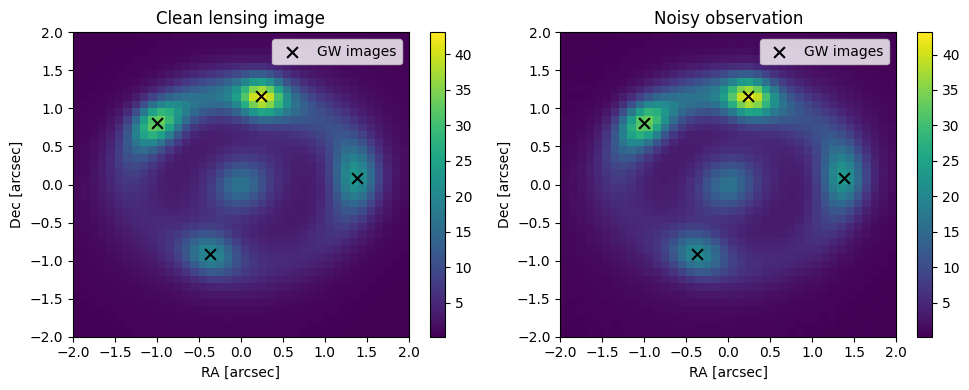

In [17]:
fig = plot_system_observation(
    ctx_1,
    cfg={"output": {"save_system_plot_path": os.path.join(OUTPUT_DIR, "system_observation.png")}},
)
plt.show()

In [19]:
ctx_1["cfg"]["priors"] = {
    #"T_star": float(tp["T_star"]), (not avail w/o GW data)
    #"dL": float(tp["dL"]), (not avail w/o GW data)
#'source_amp': 250.0,
 #'source_R_sersic': 0.4,
 #'source_n': 4.0,
 #'source_e1': -0.1,
 #'source_e2': 0.2,
 #'source_center_x': 0.05,
 #'source_center_y': 0.1,
 # 'light_amp': 50.0,
 # 'light_R_sersic': 2.0,
 # 'light_n': 4.0,
 # 'light_e1': 0.0,
 # 'light_e2': 0.1,
 # 'light_center_x': 0.0,
 # 'light_center_y': 0.0,
 # 'noise_sigma_bkg': 0.05,
 #'x_image_true_em': Array([ 1.38369666, -1.00366181,  0.23554286, -0.37044967], dtype=float64),
 #'y_image_true_em': Array([ 0.0850871 ,  0.80549262,  1.15733453, -0.91472353], dtype=float64),
 # 'lens0_gamma': 2.0,
 # 'lens0_theta_E': 1.2, #seems like keeping this is a MUST?? but dont we want to know? 
 # 'lens0_e1': 0.0, #seems like keeping at least one ellip. param is almost a must???
 #'lens0_e2': 0.1,
 'lens0_center_x': 0.0,
 'lens0_center_y': 0.0,
 #'lens1_gamma1': 0.1,
 #'lens1_gamma2': 0.0,
 'lens1_ra_0': 0.0,
 'lens1_dec_0': 0.0,
 # 'source0_amp': 250,
 # 'source0_R_sersic': 0.4,
 # 'source0_n_sersic': 4.0,
 # 'source0_e1': -0.1,
 # 'source0_e2': 0.2,
 # 'source0_center_x': 0.05,
 # 'source0_center_y': 0.1,
 # 'light0_amp': 50.0,
 # 'light0_R_sersic': 2.0,
 # 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 # 'light0_amp': 50.0,
 'light0_R_sersic': 2.0,
 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 'light0_center_x': 0.0,
 'light0_center_y': 0.0
}
cfg_1 = ctx_1["cfg"]

In [20]:
method_1 = 'deriv-approx'
samples_1, truths_1 = run_inference(
    ctx_1,
    mode="EM+GW",#"EM-only",#"GW-only",
    method=method_1,
    cfg={
        "output": {"json_tag": method_1},
        **({"inference": {"informed": True, "regularize": False,"num_chains": 8, "num_samples": 14500, "num_warmup": 9500}} if method_1 == "deriv-approx" else {}),
        # "inference": {"num_chains": 12, "num_samples": 8000, "num_warmup": 8000, "n_fisher_samples": 10000},
    },
)

use_mst in probmodel: False
k_mst in keys_to_include: False
k_mst truth: None
keys_to_include: ['lens0_gamma', 'lens0_theta_E', 'lens0_e1', 'lens0_e2', 'lens1_gamma1', 'lens1_gamma2', 'source0_amp', 'source0_R_sersic', 'source0_n_sersic', 'source0_e1', 'source0_e2', 'source0_center_x', 'source0_center_y', 'light0_amp', 'light0_e1', 'light0_e2', 'noise_sigma_bkg', 'T_star', 'dL', 'image_x1', 'image_y1', 'image_x2', 'image_y2', 'image_x3', 'image_y3', 'image_x4', 'image_y4']
input_params: {'lens0_gamma': 2.0, 'lens0_theta_E': 1.2, 'lens0_e1': 0.0, 'lens0_e2': 0.1, 'lens1_gamma1': 0.1, 'lens1_gamma2': 0.0, 'source0_amp': 250, 'source0_R_sersic': 0.4, 'source0_n_sersic': 4.0, 'source0_e1': -0.1, 'source0_e2': 0.2, 'source0_center_x': 0.05, 'source0_center_y': 0.1, 'light0_amp': 50.0, 'light0_e1': 0.0, 'light0_e2': 0.1, 'noise_sigma_bkg': 0.05, 'T_star': 14792489.407213762, 'dL': 11213.719423532619, 'image_x1': 1.3836966589326813, 'image_y1': 0.08508709734093176, 'image_x2': -1.003661805618

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]



[T_star]        	 max r_hat: 1.0000


[dL]            	 max r_hat: 1.0000


[image_x1]      	 max r_hat: 1.0000


[image_x2]      	 max r_hat: 1.0000


[image_x3]      	 max r_hat: 1.0000


[image_x4]      	 max r_hat: 1.0000


[image_y1]      	 max r_hat: 1.0000


[image_y2]      	 max r_hat: 1.0000


[image_y3]      	 max r_hat: 1.0000


[image_y4]      	 max r_hat: 1.0000


[lens0_e1]      	 max r_hat: 1.0000


[lens0_e2]      	 max r_hat: 1.0000


[lens0_gamma]   	 max r_hat: 1.0000


[lens0_theta_E]  	 max r_hat: 1.0000


[lens1_gamma1]  	 max r_hat: 1.0000


[lens1_gamma2]  	 max r_hat: 1.0000


[light0_amp]    	 max r_hat: 1.0000


[light0_e1]     	 max r_hat: 1.0000


[light0_e2]     	 max r_hat: 1.0000


[noise_sigma_bkg]  	 max r_hat: 1.0000


[source0_R_sersic]  	 max r_hat: 1.0000


[source0_amp]   	 max r_hat: 1.0000


[source0_center_x]  	 max r_hat: 1.0000


[source0_center_y]  	 max r_hat: 1.0000


[source0_e1]    	 max r_hat: 1.0000


[source0_e2]    	 max r_hat: 1.0

In [21]:
import corner

/Users/sangchunyeh/workspace/research/internship/2026_CUHK/lens_reconstruction/.venv/lib/python3.13/site-packages/arviz/__init__.py:39: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


[<Figure size 760x760 with 9 Axes>,
 <Figure size 1600x1600 with 49 Axes>,
 <Figure size 1390x1390 with 36 Axes>,
 <Figure size 550x550 with 4 Axes>,
 <Figure size 1810x1810 with 64 Axes>,
 <Figure size 340x340 with 1 Axes>]

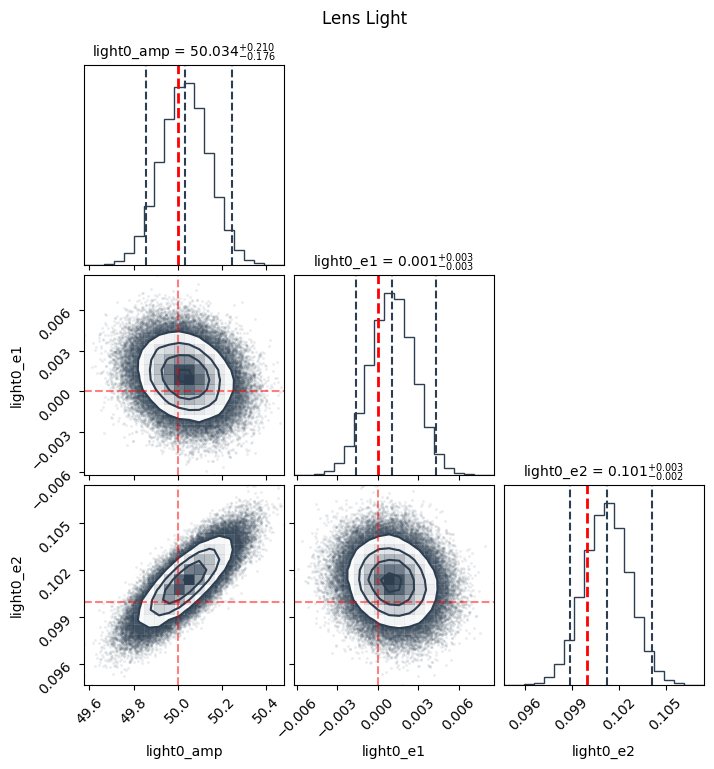

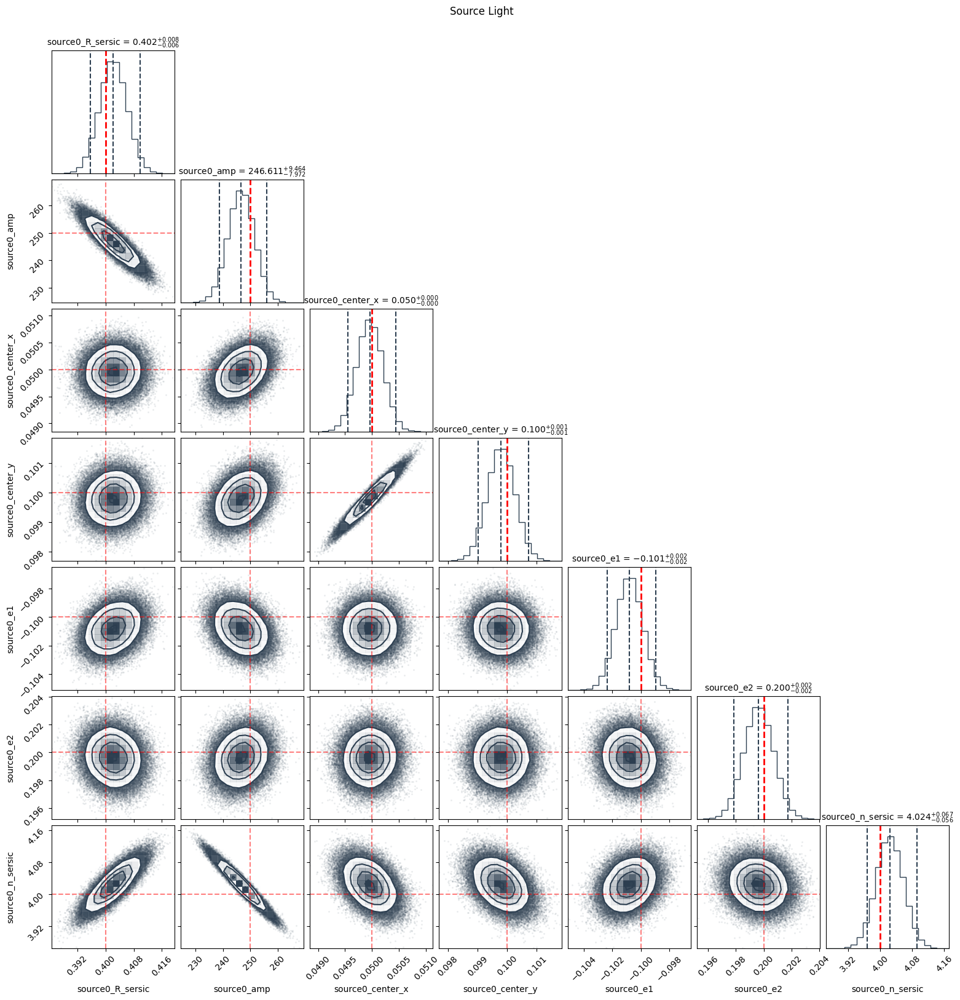

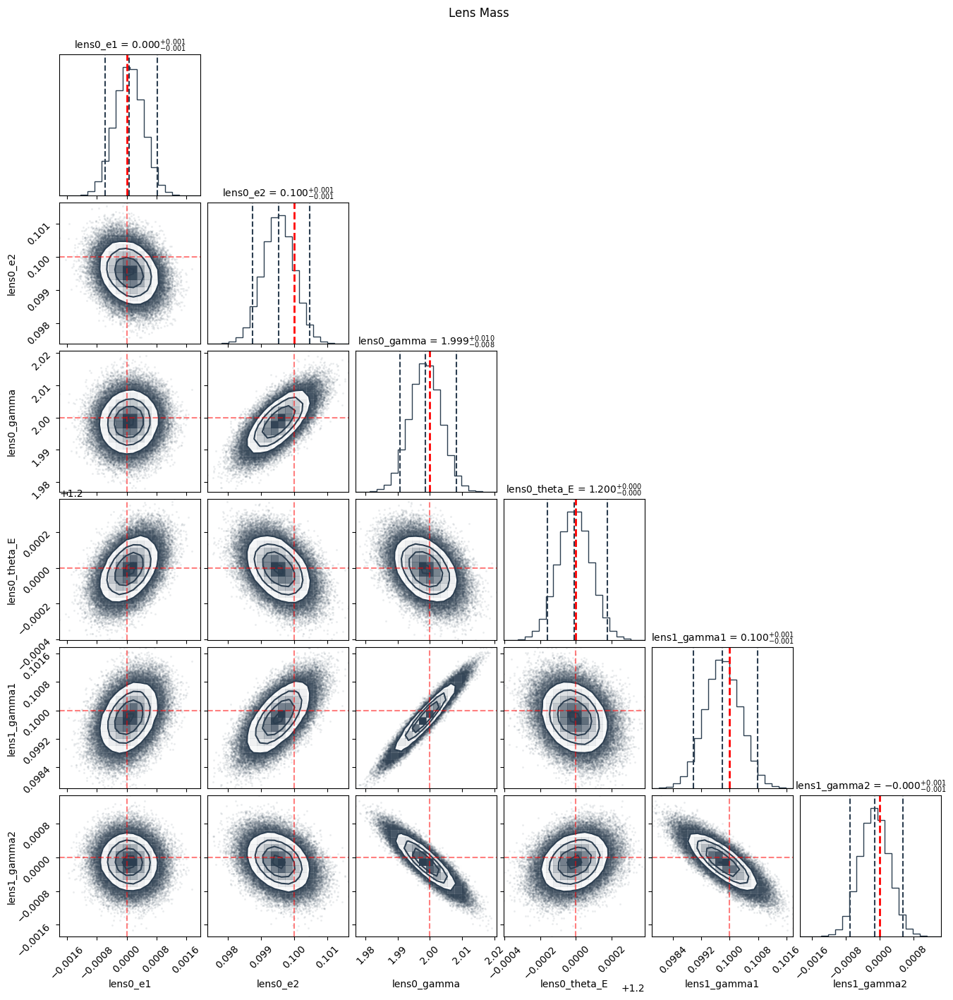

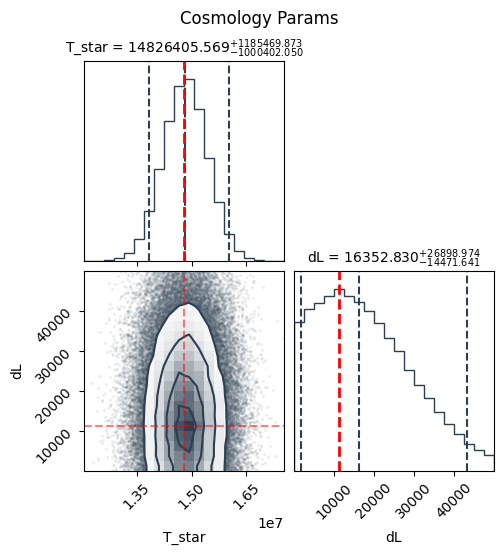

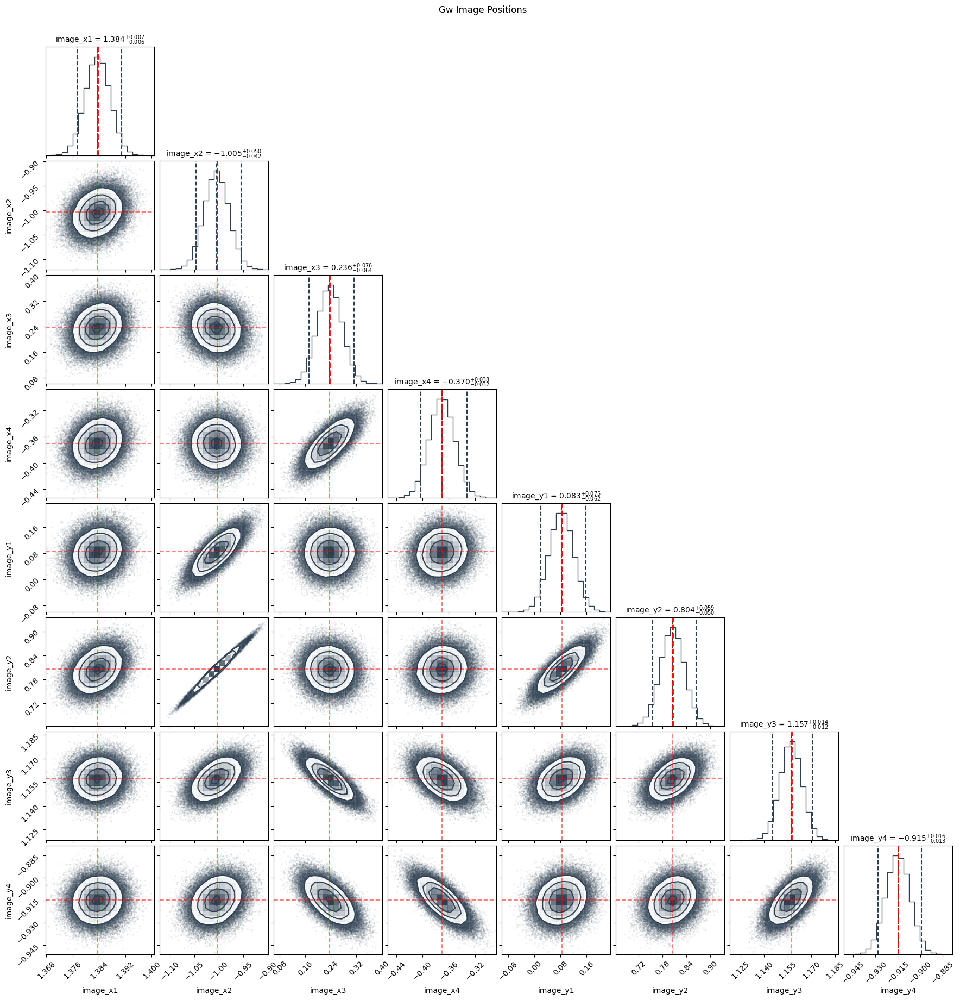

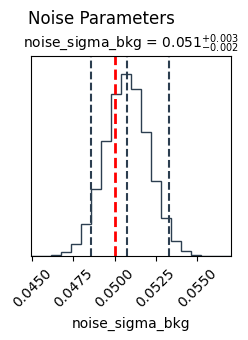

In [29]:
plot_posterior(
        samples_1,
        truths_1,
        cfg={
            "output": {"output_dir": None},
            "plot": {
                "plot_mode": "groupwise",
                "save_path": None,
            },
        },
    )

## Galaxy 2 (not GW source)
slightly smaller than the GW source, rounder mass distrnibution and somewhat larger light profile

In [89]:
source_pos = (0.02, 0.08)
cfg_2 = {
    "em": {
        "pixel_grid_kwargs": {"npix": int(40), "pix_scl": 0.1},
        "psf_kwargs": {"psf_type": "GAUSSIAN", "fwhm": 0.4, "pixel_size": 0.1},#0.067
        "noise_simu_kwargs": {"npix": int(40), "background_rms": 5e-2, "exposure_time": 2200},
        "noise_inf_kwargs": {"npix": int(40), "background_rms": None, "exposure_time": 2200},
        "kwargs_numerics": DEFAULT_KWARGS_NUMERICS,
        "exposure_time": 2200,
        "seed": 87651,
        "source_pos": source_pos,
        "kwargs_source": [
            {
                "amp": 250,
                "R_sersic": 0.4,
                "n_sersic": 4.0,
                "e1": -0.1,
                "e2": 0.2,
                "center_x": source_pos[0],
                "center_y": source_pos[1],
            }
        ],
        "kwargs_lens_light": [
            {
                "amp": 65.0,
                "R_sersic": 2.6,
                "n_sersic": 4.0,
                "e1": 0.08,
                "e2": 0.12,
                "center_x": 0.0,
                "center_y": 0.0,
            }
        ],
    },
    "lens": {
        "lens_model_list": ["EPL", "SHEAR"],
        "kwargs_lens": [
            {
                "theta_E": 1.05,
                "e1": 0.08,
                "e2": 0.15,
                "gamma": 2.08,
                "center_x": 0.0,
                "center_y": 0.0,
            },
            {"gamma1": 0.06, "gamma2": -0.03, "ra_0": 0.0, "dec_0": 0.0},
        ],
        "zl": 0.75,
        "zs": 1.55,
    },
    "gw": {"enabled": False},
    "plot": {"plot_mode": "groupwise", "save_path": None, "save_tag": None, "hist_kwargs": {"density": True}},
    "source_plane": {"filter_std": None, "use_filtered": False},
    "output": {
        "output_dir": OUTPUT_DIR,
        "save_samples_path": None,
        "save_truths_path": None,
        "save_source_samples_path": None,
        "save_system_plot_path": None,
        "json_path": None,
    },
}

In [90]:
cfg_2["use_parameter_layout"] = True

In [91]:
ctx_2: dict = setup_em_observation(cfg=cfg_2)

ctx_2: dict = setup_gw_observation(ctx_2, cfg=cfg_2)

In [92]:
ctx_2.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst'])

In [93]:
len(gw_truth_data)

5

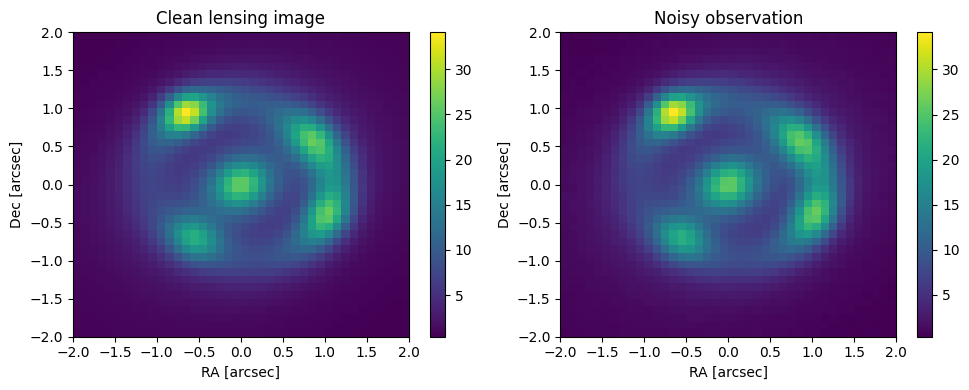

In [94]:
fig = plot_system_observation(
    ctx_2,
    cfg={"output": {"save_system_plot_path": os.path.join(OUTPUT_DIR, "system_observation.png")}},
)
plt.show()

In [97]:
ctx_2.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst'])

In [100]:
gw_truth_data.keys()

dict_keys(['gw_obs', 'data_GW', 'lens_gw', 'x_img_gw', 'y_img_gw', 'n_images'])

In [101]:
ctx_2 = ctx_2 | gw_truth_data

In [102]:
ctx_2.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst', 'gw_obs', 'data_GW', 'lens_gw', 'x_img_gw', 'y_img_gw', 'n_images'])

In [104]:
ctx_2['truth_params']['T_star'] = ctx_1['truth_params']['T_star']
ctx_2['truth_params']['dL'] = ctx_1['truth_params']['dL']
ctx_2['truth_params']['image_x1'] = ctx_1['truth_params']['image_x1']
ctx_2['truth_params']['image_x2'] = ctx_1['truth_params']['image_x2']
ctx_2['truth_params']['image_x3'] = ctx_1['truth_params']['image_x3']
ctx_2['truth_params']['image_x4'] = ctx_1['truth_params']['image_x4']
ctx_2['truth_params']['image_y1'] = ctx_1['truth_params']['image_y1']
ctx_2['truth_params']['image_y2'] = ctx_1['truth_params']['image_y2']
ctx_2['truth_params']['image_y3'] = ctx_1['truth_params']['image_y3']
ctx_2['truth_params']['image_y4'] = ctx_1['truth_params']['image_y4']

In [105]:
len(ctx_1['truth_params'])

51

In [106]:
len(ctx_2['truth_params'])

51

In [107]:
ctx_2["cfg"]["priors"] = {
    #"T_star": float(tp["T_star"]), (not avail w/o GW data)
    #"dL": float(tp["dL"]), (not avail w/o GW data)
#'source_amp': 250.0,
 #'source_R_sersic': 0.4,
 #'source_n': 4.0,
 #'source_e1': -0.1,
 #'source_e2': 0.2,
 #'source_center_x': 0.05,
 #'source_center_y': 0.1,
 # 'light_amp': 50.0,
 # 'light_R_sersic': 2.0,
 # 'light_n': 4.0,
 # 'light_e1': 0.0,
 # 'light_e2': 0.1,
 # 'light_center_x': 0.0,
 # 'light_center_y': 0.0,
 # 'noise_sigma_bkg': 0.05,
 #'x_image_true_em': Array([ 1.38369666, -1.00366181,  0.23554286, -0.37044967], dtype=float64),
 #'y_image_true_em': Array([ 0.0850871 ,  0.80549262,  1.15733453, -0.91472353], dtype=float64),
 # 'lens0_gamma': 2.0,
 # 'lens0_theta_E': 1.2, #seems like keeping this is a MUST?? but dont we want to know? 
 # 'lens0_e1': 0.0, #seems like keeping at least one ellip. param is almost a must???
 #'lens0_e2': 0.1,
 'lens0_center_x': 0.0,
 'lens0_center_y': 0.0,
 #'lens1_gamma1': 0.1,
 #'lens1_gamma2': 0.0,
 'lens1_ra_0': 0.0,
 'lens1_dec_0': 0.0,
 # 'source0_amp': 250,
 # 'source0_R_sersic': 0.4,
 # 'source0_n_sersic': 4.0,
 # 'source0_e1': -0.1,
 # 'source0_e2': 0.2,
 # 'source0_center_x': 0.05,
 # 'source0_center_y': 0.1,
 # 'light0_amp': 50.0,
 # 'light0_R_sersic': 2.0,
 # 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 # 'light0_amp': 50.0,
 'light0_R_sersic': 2.0,
 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 'light0_center_x': 0.0,
 'light0_center_y': 0.0
}
cfg_2 = ctx_2["cfg"]

In [108]:
method_1 = 'deriv-approx'
samples_2, truths_2 = run_inference(
    ctx_2,
    mode="EM+GW",#"EM-only",#"GW-only",
    method=method_1,
    cfg={
        "output": {"json_tag": method_1},
        **({"inference": {"informed": True, "regularize": False,"num_chains": 8, "num_samples": 14500, "num_warmup": 9500}} if method_1 == "deriv-approx" else {}),
        # "inference": {"num_chains": 12, "num_samples": 8000, "num_warmup": 8000, "n_fisher_samples": 10000},
    },
)

use_mst in probmodel: False
k_mst in keys_to_include: False
k_mst truth: None
keys_to_include: ['lens0_gamma', 'lens0_theta_E', 'lens0_e1', 'lens0_e2', 'lens1_gamma1', 'lens1_gamma2', 'source0_amp', 'source0_R_sersic', 'source0_n_sersic', 'source0_e1', 'source0_e2', 'source0_center_x', 'source0_center_y', 'light0_amp', 'light0_e1', 'light0_e2', 'noise_sigma_bkg', 'T_star', 'dL', 'image_x1', 'image_y1', 'image_x2', 'image_y2', 'image_x3', 'image_y3', 'image_x4', 'image_y4']
input_params: {'lens0_gamma': 2.08, 'lens0_theta_E': 1.05, 'lens0_e1': 0.08, 'lens0_e2': 0.15, 'lens1_gamma1': 0.06, 'lens1_gamma2': -0.03, 'source0_amp': 250, 'source0_R_sersic': 0.4, 'source0_n_sersic': 4.0, 'source0_e1': -0.1, 'source0_e2': 0.2, 'source0_center_x': 0.02, 'source0_center_y': 0.08, 'light0_amp': 65.0, 'light0_e1': 0.08, 'light0_e2': 0.12, 'noise_sigma_bkg': 0.05, 'T_star': 14792489.407213762, 'dL': 11213.719423532619, 'image_x1': 1.3836966589326813, 'image_y1': 0.08508709734093176, 'image_x2': -1.00

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]



[T_star]        	 max r_hat: 1.0001


[dL]            	 max r_hat: 1.0000


[image_x1]      	 max r_hat: 1.0000


[image_x2]      	 max r_hat: 1.0009


[image_x3]      	 max r_hat: 1.0000


[image_x4]      	 max r_hat: 1.0000


[image_y1]      	 max r_hat: 1.0008


[image_y2]      	 max r_hat: 1.0005


[image_y3]      	 max r_hat: 1.0000


[image_y4]      	 max r_hat: 1.0016


[lens0_e1]      	 max r_hat: 1.0000


[lens0_e2]      	 max r_hat: 1.0001


[lens0_gamma]   	 max r_hat: 1.0009


[lens0_theta_E]  	 max r_hat: 1.0000


[lens1_gamma1]  	 max r_hat: 1.0003


[lens1_gamma2]  	 max r_hat: 1.0003


[light0_amp]    	 max r_hat: 1.0000


[light0_e1]     	 max r_hat: 1.0000


[light0_e2]     	 max r_hat: 1.0000


[noise_sigma_bkg]  	 max r_hat: 1.0000


[source0_R_sersic]  	 max r_hat: 1.0000


[source0_amp]   	 max r_hat: 1.0000


[source0_center_x]  	 max r_hat: 1.0000


[source0_center_y]  	 max r_hat: 1.0000


[source0_e1]    	 max r_hat: 1.0000


[source0_e2]    	 max r_hat: 1.0

[<Figure size 760x760 with 9 Axes>,
 <Figure size 1600x1600 with 49 Axes>,
 <Figure size 1390x1390 with 36 Axes>,
 <Figure size 550x550 with 4 Axes>,
 <Figure size 1810x1810 with 64 Axes>,
 <Figure size 340x340 with 1 Axes>]

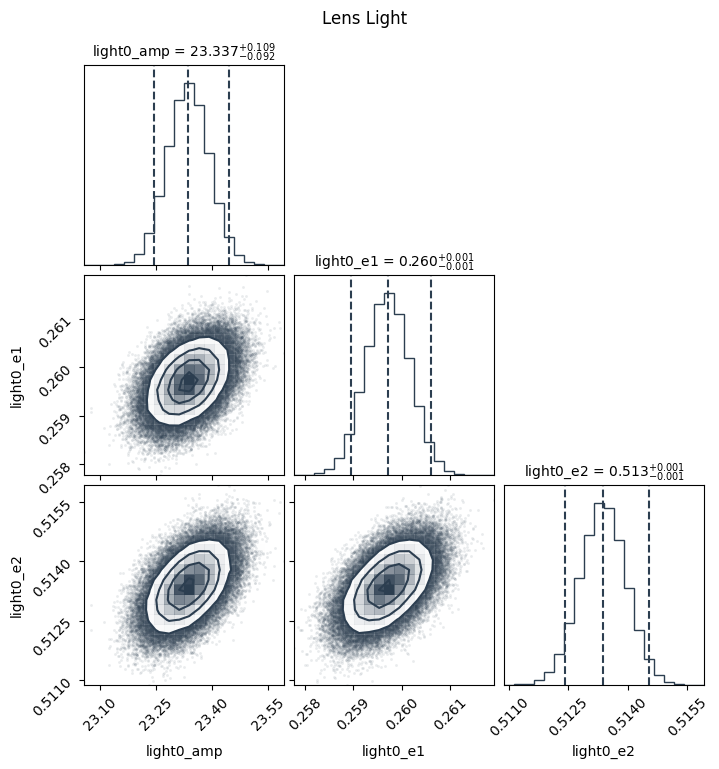

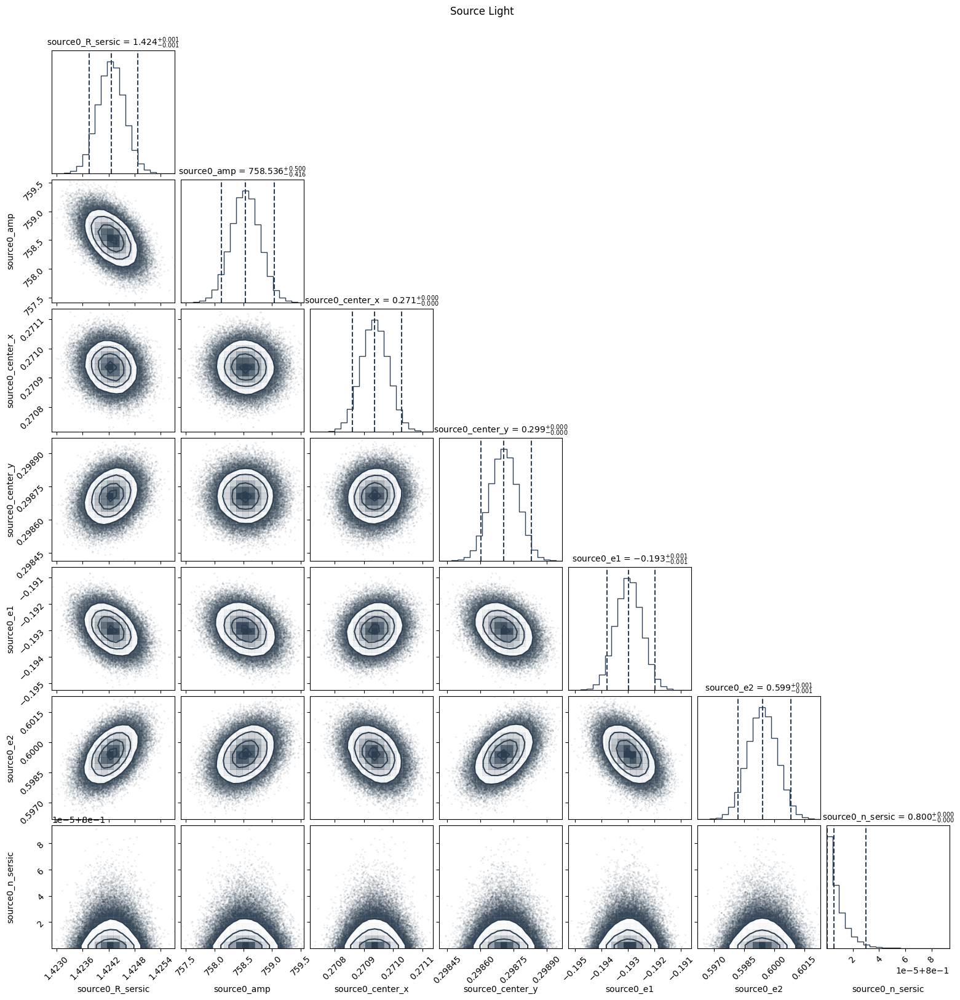

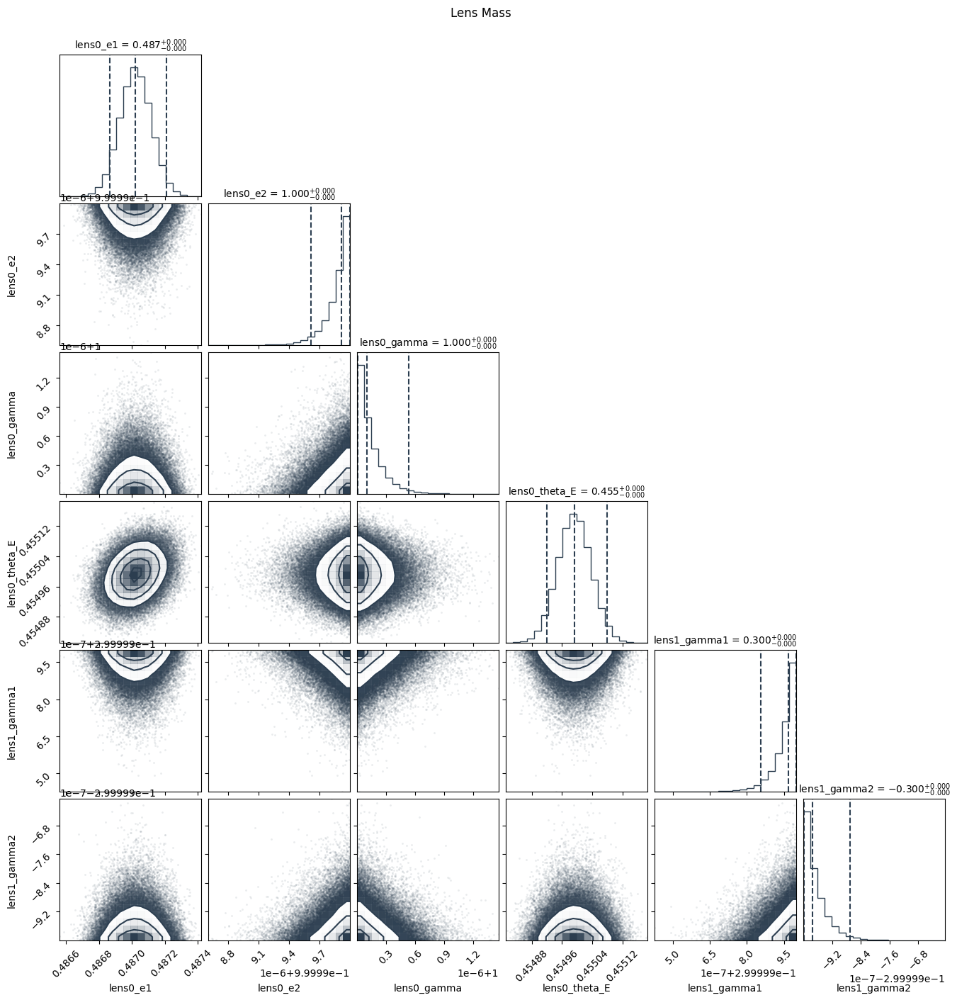

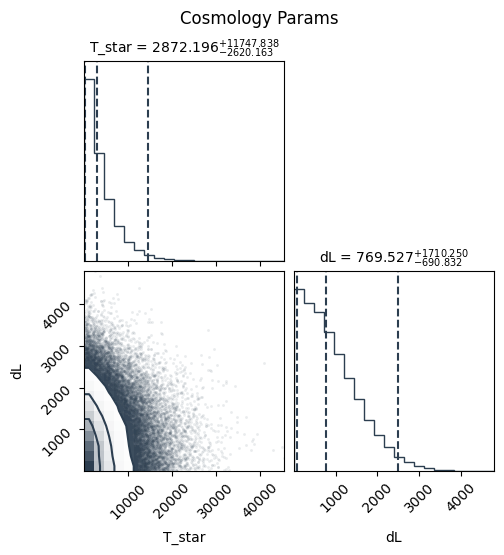

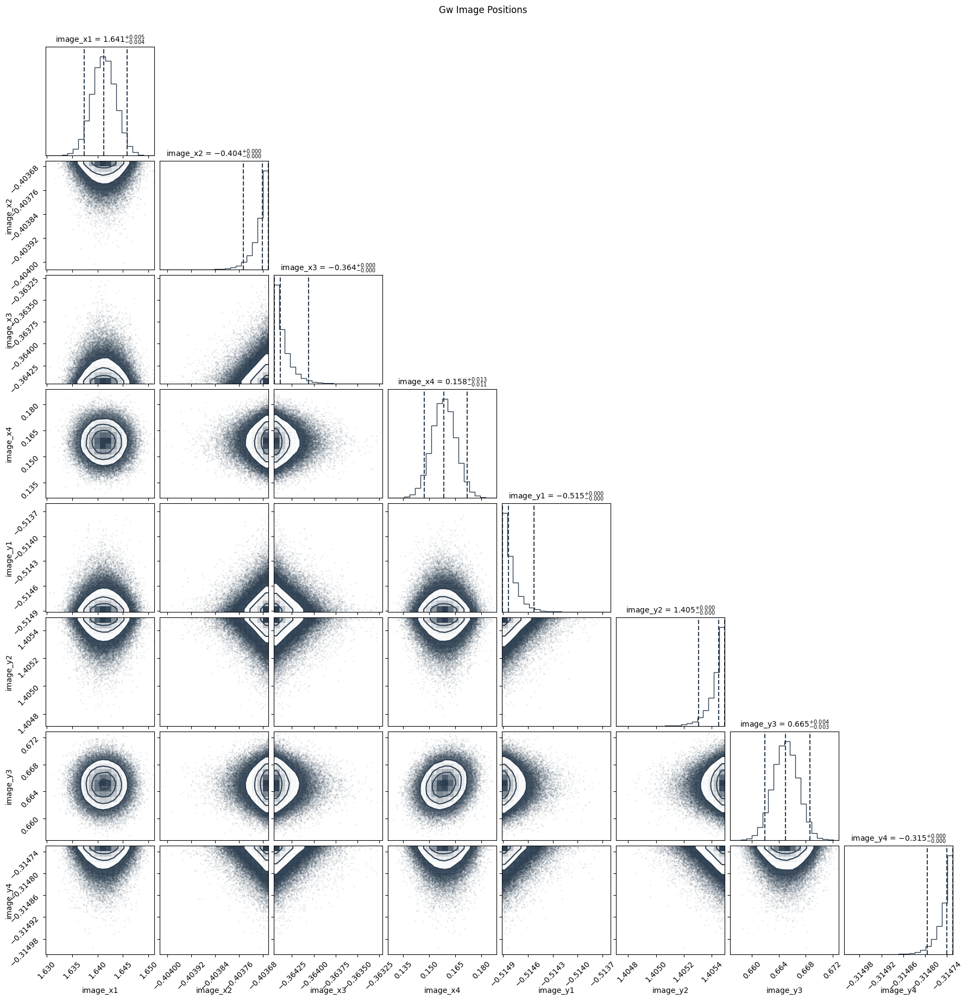

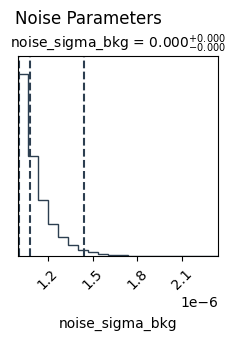

In [109]:
plot_posterior(
        samples_2,
        truths_2,
        cfg={
            "output": {"output_dir": None},
            "plot": {
                "plot_mode": "groupwise",
                "save_path": None,
            },
        },
    )

## Galaxy 3 (Also not GW source)
Similar mass scale but more elliptical and under a different external shear

In [69]:
source_pos = (-0.04, 0.12)
cfg_3 = {
    "em": {
        "pixel_grid_kwargs": {"npix": int(40), "pix_scl": 0.1},
        "psf_kwargs": {"psf_type": "GAUSSIAN", "fwhm": 0.4, "pixel_size": 0.1},#0.067
        "noise_simu_kwargs": {"npix": int(40), "background_rms": 5e-2, "exposure_time": 2200},
        "noise_inf_kwargs": {"npix": int(40), "background_rms": None, "exposure_time": 2200},
        "kwargs_numerics": DEFAULT_KWARGS_NUMERICS,
        "exposure_time": 2200,
        "seed": 87651,
        "source_pos": source_pos,
        "kwargs_source": [
            {
                "amp": 250,
                "R_sersic": 0.4,
                "n_sersic": 4.0,
                "e1": -0.1,
                "e2": 0.2,
                "center_x": source_pos[0],
                "center_y": source_pos[1],
            }
        ],
        "kwargs_lens_light": [
            {
                "amp": 65.0,
                "R_sersic": 2.6,
                "n_sersic": 4.0,
                "e1": 0.08,
                "e2": 0.12,
                "center_x": 0.0,
                "center_y": 0.0,
            }
        ],
    },
    "lens": {
        "lens_model_list": ["EPL", "SHEAR"],
        "kwargs_lens": [
            {
                "theta_E": 1.18,
                "e1": -0.12,
                "e2": 0.18,
                "gamma": 1.96,
                "center_x": 0.0,
                "center_y": 0.0,
            },
            {"gamma1": 0.12, "gamma2": 0.05, "ra_0": 0.0, "dec_0": 0.0},
        ],
        "zl": 0.75,
        "zs": 1.55,
    },
    "gw": {"enabled": False},
    "plot": {"plot_mode": "groupwise", "save_path": None, "save_tag": None, "hist_kwargs": {"density": True}},
    "source_plane": {"filter_std": None, "use_filtered": False},
    "output": {
        "output_dir": OUTPUT_DIR,
        "save_samples_path": None,
        "save_truths_path": None,
        "save_source_samples_path": None,
        "save_system_plot_path": None,
        "json_path": None,
    },
}

In [110]:
cfg_3["use_parameter_layout"] = True

In [111]:
ctx_3: dict = setup_em_observation(cfg=cfg_3)

ctx_2: dict = setup_gw_observation(ctx_2, cfg=cfg_2)

In [112]:
ctx_3.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst'])

In [113]:
len(gw_truth_data)

6

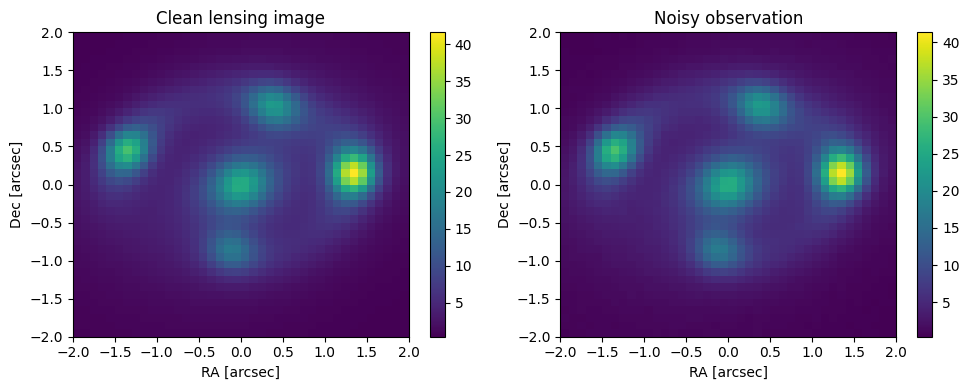

In [114]:
fig = plot_system_observation(
    ctx_3,
    cfg={"output": {"save_system_plot_path": os.path.join(OUTPUT_DIR, "system_observation.png")}},
)
plt.show()

In [115]:
ctx_3.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst'])

In [116]:
gw_truth_data.keys()

dict_keys(['gw_obs', 'data_GW', 'lens_gw', 'x_img_gw', 'y_img_gw', 'n_images'])

In [117]:
ctx_3 = ctx_3 | gw_truth_data

In [118]:
ctx_2.keys()

dict_keys(['cfg', 'kwargs_lens', 'lens_model_list', 'lens_mass_model', 'pixel_grid', 'lens_image', 'noise_inf', 'em_obs', 'truth_params', 'use_mst', 'k_mst', 'gw_obs', 'data_GW', 'lens_gw', 'x_img_gw', 'y_img_gw', 'n_images', 'likelihood', 'fisher'])

In [119]:
ctx_3['truth_params']['T_star'] = ctx_1['truth_params']['T_star']
ctx_3['truth_params']['dL'] = ctx_1['truth_params']['dL']
ctx_3['truth_params']['image_x1'] = ctx_1['truth_params']['image_x1']
ctx_3['truth_params']['image_x2'] = ctx_1['truth_params']['image_x2']
ctx_3['truth_params']['image_x3'] = ctx_1['truth_params']['image_x3']
ctx_3['truth_params']['image_x4'] = ctx_1['truth_params']['image_x4']
ctx_3['truth_params']['image_y1'] = ctx_1['truth_params']['image_y1']
ctx_3['truth_params']['image_y2'] = ctx_1['truth_params']['image_y2']
ctx_3['truth_params']['image_y3'] = ctx_1['truth_params']['image_y3']
ctx_3['truth_params']['image_y4'] = ctx_1['truth_params']['image_y4']

In [120]:
len(ctx_1['truth_params'])

51

In [121]:
len(ctx_3['truth_params'])

51

In [122]:
ctx_3["cfg"]["priors"] = {
    #"T_star": float(tp["T_star"]), (not avail w/o GW data)
    #"dL": float(tp["dL"]), (not avail w/o GW data)
#'source_amp': 250.0,
 #'source_R_sersic': 0.4,
 #'source_n': 4.0,
 #'source_e1': -0.1,
 #'source_e2': 0.2,
 #'source_center_x': 0.05,
 #'source_center_y': 0.1,
 # 'light_amp': 50.0,
 # 'light_R_sersic': 2.0,
 # 'light_n': 4.0,
 # 'light_e1': 0.0,
 # 'light_e2': 0.1,
 # 'light_center_x': 0.0,
 # 'light_center_y': 0.0,
 # 'noise_sigma_bkg': 0.05,
 #'x_image_true_em': Array([ 1.38369666, -1.00366181,  0.23554286, -0.37044967], dtype=float64),
 #'y_image_true_em': Array([ 0.0850871 ,  0.80549262,  1.15733453, -0.91472353], dtype=float64),
 # 'lens0_gamma': 2.0,
 # 'lens0_theta_E': 1.2, #seems like keeping this is a MUST?? but dont we want to know? 
 # 'lens0_e1': 0.0, #seems like keeping at least one ellip. param is almost a must???
 #'lens0_e2': 0.1,
 'lens0_center_x': 0.0,
 'lens0_center_y': 0.0,
 #'lens1_gamma1': 0.1,
 #'lens1_gamma2': 0.0,
 'lens1_ra_0': 0.0,
 'lens1_dec_0': 0.0,
 # 'source0_amp': 250,
 # 'source0_R_sersic': 0.4,
 # 'source0_n_sersic': 4.0,
 # 'source0_e1': -0.1,
 # 'source0_e2': 0.2,
 # 'source0_center_x': 0.05,
 # 'source0_center_y': 0.1,
 # 'light0_amp': 50.0,
 # 'light0_R_sersic': 2.0,
 # 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 # 'light0_amp': 50.0,
 'light0_R_sersic': 2.0,
 'light0_n_sersic': 4.0,
 # 'light0_e1': 0.0,
 # 'light0_e2': 0.1,
 'light0_center_x': 0.0,
 'light0_center_y': 0.0
}
cfg_3 = ctx_3["cfg"]

In [123]:
method_1 = 'deriv-approx'
samples_3, truths_3 = run_inference(
    ctx_3,
    mode="EM+GW",#"EM-only",#"GW-only",
    method=method_1,
    cfg={
        "output": {"json_tag": method_1},
        **({"inference": {"informed": True, "regularize": False,"num_chains": 8, "num_samples": 14500, "num_warmup": 9500}} if method_1 == "deriv-approx" else {}),
        # "inference": {"num_chains": 12, "num_samples": 8000, "num_warmup": 8000, "n_fisher_samples": 10000},
    },
)

use_mst in probmodel: False
k_mst in keys_to_include: False
k_mst truth: None
keys_to_include: ['lens0_gamma', 'lens0_theta_E', 'lens0_e1', 'lens0_e2', 'lens1_gamma1', 'lens1_gamma2', 'source0_amp', 'source0_R_sersic', 'source0_n_sersic', 'source0_e1', 'source0_e2', 'source0_center_x', 'source0_center_y', 'light0_amp', 'light0_e1', 'light0_e2', 'noise_sigma_bkg', 'T_star', 'dL', 'image_x1', 'image_y1', 'image_x2', 'image_y2', 'image_x3', 'image_y3', 'image_x4', 'image_y4']
input_params: {'lens0_gamma': 1.96, 'lens0_theta_E': 1.18, 'lens0_e1': -0.12, 'lens0_e2': 0.18, 'lens1_gamma1': 0.12, 'lens1_gamma2': 0.05, 'source0_amp': 250, 'source0_R_sersic': 0.4, 'source0_n_sersic': 4.0, 'source0_e1': -0.1, 'source0_e2': 0.2, 'source0_center_x': -0.04, 'source0_center_y': 0.12, 'light0_amp': 65.0, 'light0_e1': 0.08, 'light0_e2': 0.12, 'noise_sigma_bkg': 0.05, 'T_star': 14792489.407213762, 'dL': 11213.719423532619, 'image_x1': 1.3836966589326813, 'image_y1': 0.08508709734093176, 'image_x2': -1.0

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]

  0%|          | 0/24000 [00:00<?, ?it/s]



[T_star]        	 max r_hat: 1.0000


[dL]            	 max r_hat: 1.0000


[image_x1]      	 max r_hat: 1.0000


[image_x2]      	 max r_hat: 1.0000


[image_x3]      	 max r_hat: 1.0000


[image_x4]      	 max r_hat: 1.0000


[image_y1]      	 max r_hat: 1.0000


[image_y2]      	 max r_hat: 1.0000


[image_y3]      	 max r_hat: 1.0000


[image_y4]      	 max r_hat: 1.0000


[lens0_e1]      	 max r_hat: 1.0000


[lens0_e2]      	 max r_hat: 1.0000


[lens0_gamma]   	 max r_hat: 1.0000


[lens0_theta_E]  	 max r_hat: 1.0000


[lens1_gamma1]  	 max r_hat: 1.0000


[lens1_gamma2]  	 max r_hat: 1.0000


[light0_amp]    	 max r_hat: 1.0000


[light0_e1]     	 max r_hat: 1.0000


[light0_e2]     	 max r_hat: 1.0000


[noise_sigma_bkg]  	 max r_hat: 1.0000


[source0_R_sersic]  	 max r_hat: 1.0000


[source0_amp]   	 max r_hat: 1.0000


[source0_center_x]  	 max r_hat: 1.0000


[source0_center_y]  	 max r_hat: 1.0000


[source0_e1]    	 max r_hat: 1.0000


[source0_e2]    	 max r_hat: 1.0

[<Figure size 760x760 with 9 Axes>,
 <Figure size 1600x1600 with 49 Axes>,
 <Figure size 1390x1390 with 36 Axes>,
 <Figure size 550x550 with 4 Axes>,
 <Figure size 1810x1810 with 64 Axes>,
 <Figure size 340x340 with 1 Axes>]

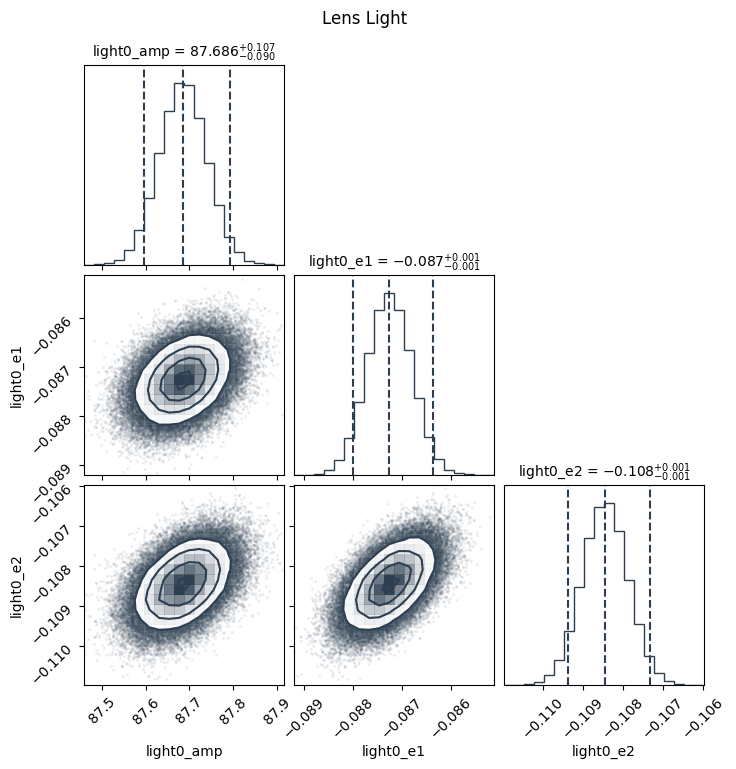

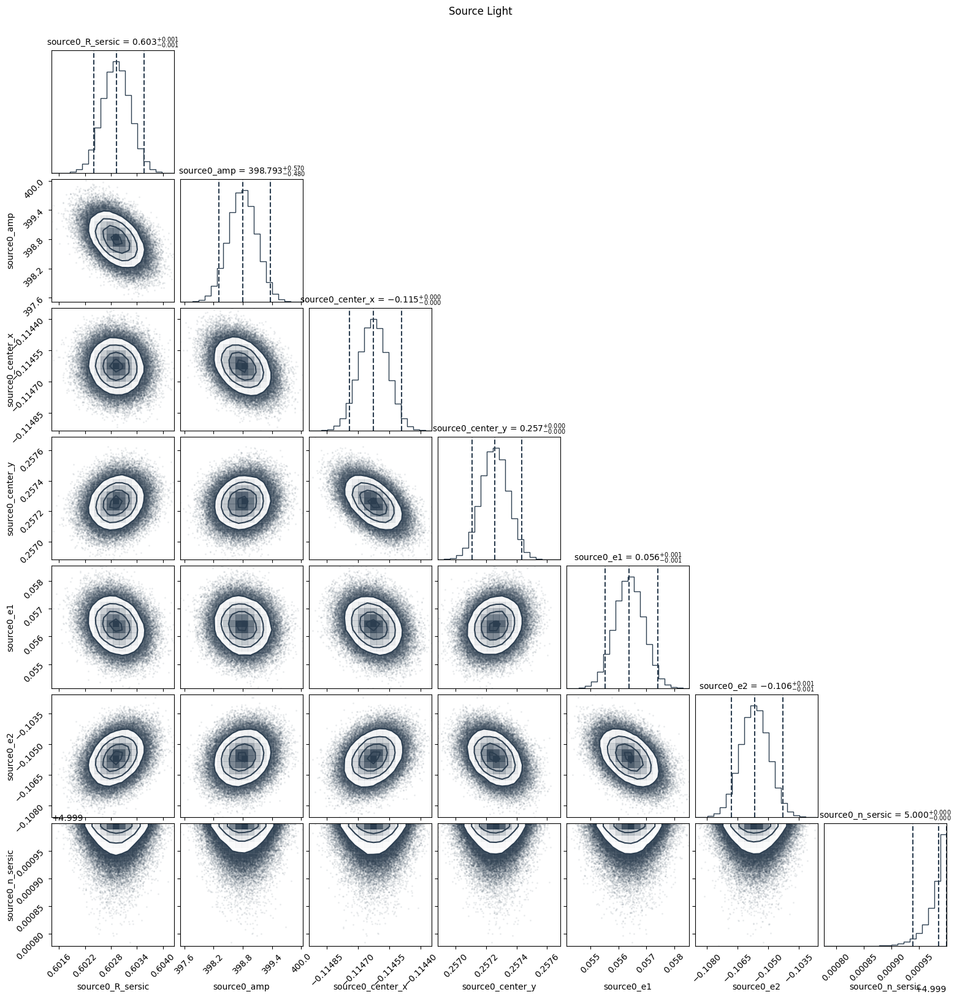

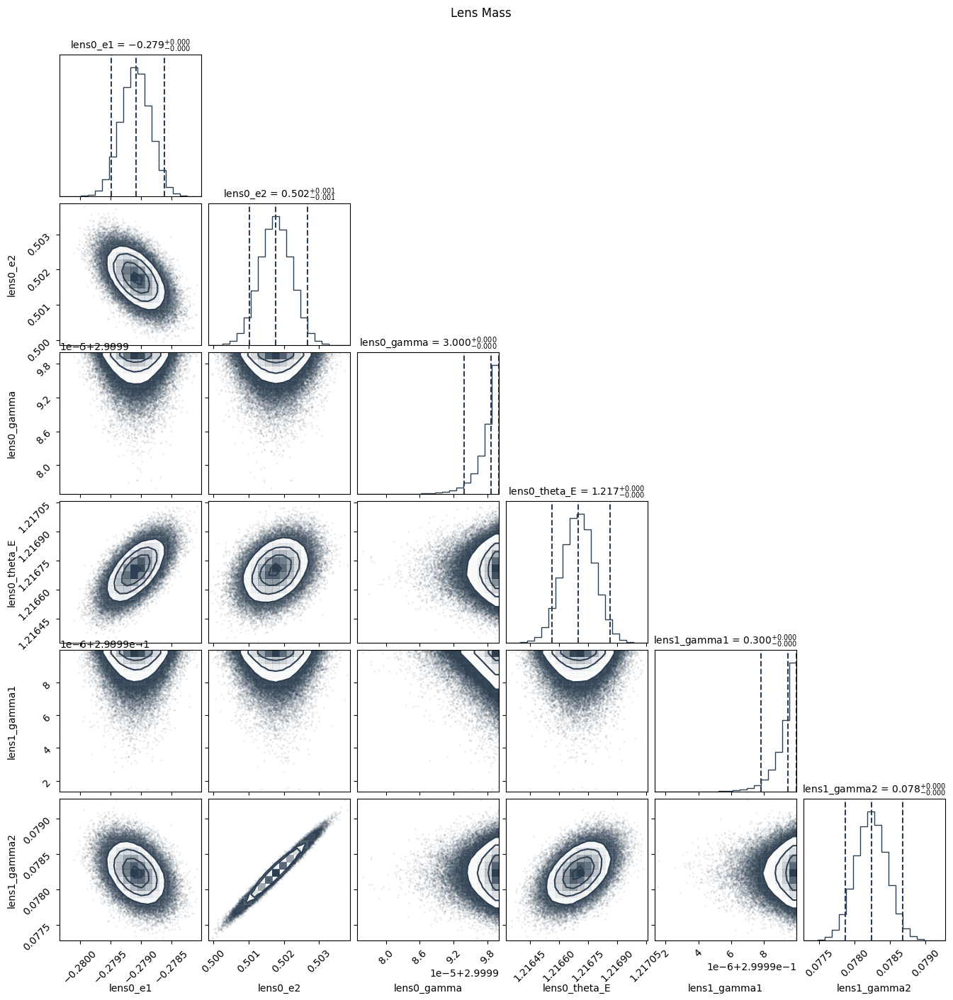

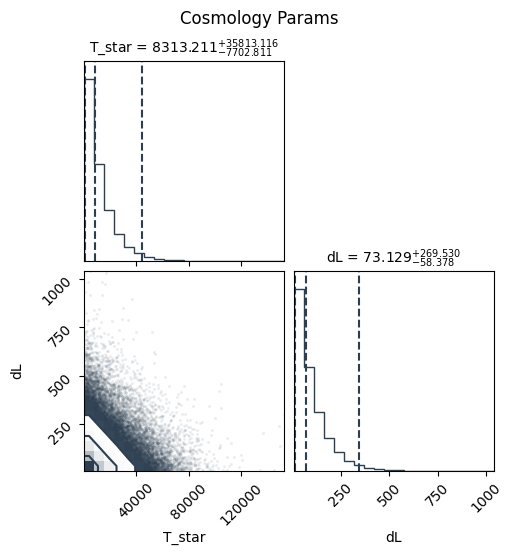

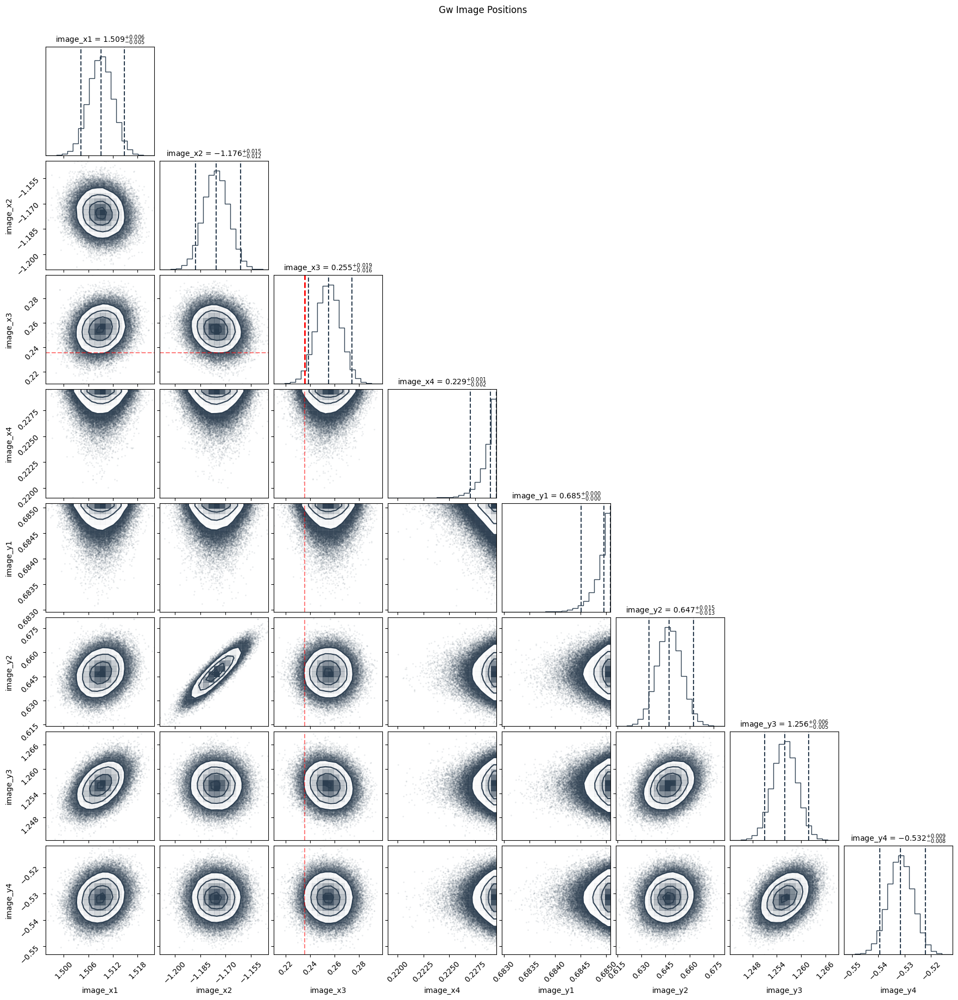

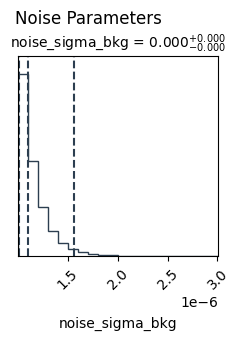

In [124]:
plot_posterior(
        samples_3,
        truths_3,
        cfg={
            "output": {"output_dir": None},
            "plot": {
                "plot_mode": "groupwise",
                "save_path": None,
            },
        },
    )

### Generating 50 galaxy location in a 5 deg^2 skypatch

In [9]:
size = float(np.sqrt(5))

In [14]:
import random

locations = []

for i in range(3):
    galaxy = dict()
    galaxy['ident'] = i
    x = random.uniform(0, size)
    y = random.uniform(0, size)
    galaxy['position'] = (x, y)
    locations.append(galaxy)

#fix few parameters to "cheat"

Euclid wide survey is 14,000 square degrees. Collett predicts that euclid should discover 170000 galaxy galaxy strong lenses. So thats on average 12 lenses per square degree

In [15]:
locations

[{'ident': 0, 'position': (1.0860594926684608, 0.17084334336883086)},
 {'ident': 1, 'position': (1.0053836450632052, 0.9980413476747028)},
 {'ident': 2, 'position': (0.3366299988200846, 0.5893635164017095)}]